In [11]:
import glob2 as glob
import os
import matplotlib.pyplot as plt
import numpy as np
import tonic
import time

/data/work/pweidel/venv/lib/python3.8/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [12]:
HARDVS_PATH = "/ssd2/users/pweidel/datasets/HARDVS/MINIHARDVS_EVENT_files/"

In [13]:
action = "action_001/"

In [14]:
path = os.path.join(HARDVS_PATH, action)
type(path)

str

In [15]:
fns = glob.glob(HARDVS_PATH + "**/*.npz")
print(len(fns))


107710


In [16]:
fns = glob.glob(path + "**/*.npz")
print(len(fns))

500


In [17]:
fn = fns[1]
label = fn.split('/')[-3].split('_')[1]
print(int(label))

1


In [20]:
t0 = time.time()

n = fns[1]
data = np.load(fn, allow_pickle=True)
events = np.zeros(len(data['t']), dtype=np.dtype([("x", int), ("y", int), ("t", int), ("p", int)]))
events['t'] = data['t']
events['x'] = data['x']
events['y'] = data['y']
events['p'] = data['p'] * 2 - 1

imgs = []
img = np.zeros([1, 346, 260])
t_last = None
dt = 1000000 / 60 # 60 FPS
tau = dt * 2
for i, e in enumerate(events):
    if not t_last:
        t_last = e[2]
        t_next = e[2] + dt

    img[0, e[0], e[1]] += e['p']#np.exp(-(t_next - e[2]) / tau) * e['p']

    if e[2] - t_last >= dt:
        imgs.append(np.repeat(img.copy(), 3, 0))
        t_next += dt
        img *= np.exp(-(dt / tau))
        t_last = e[2]
        
    e_last = e
print("DUR", time.time() - t0, np.shape(imgs))

DUR 1.8834748268127441 (121, 3, 346, 260)


In [25]:
ii = [imgs[i] for i in np.linspace(0, 120, 10).astype(int)]

In [31]:
torch.stack([torch.Tensor(i) for i in ii]).shape #np.shape(ii)

torch.Size([10, 3, 346, 260])

In [81]:
def normalize(img):
    img = img - img.min()
    # img = img.clip(0, 10)
    return img / img.max()

In [82]:
imgs[0].shape

(3, 346, 260)

/tmp/ipykernel_3267256/1066545021.py:2: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  plt.figure()


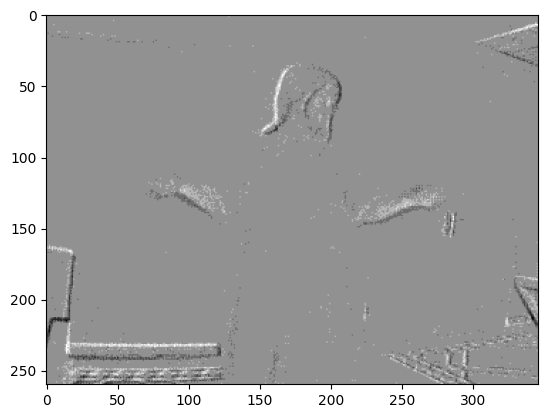

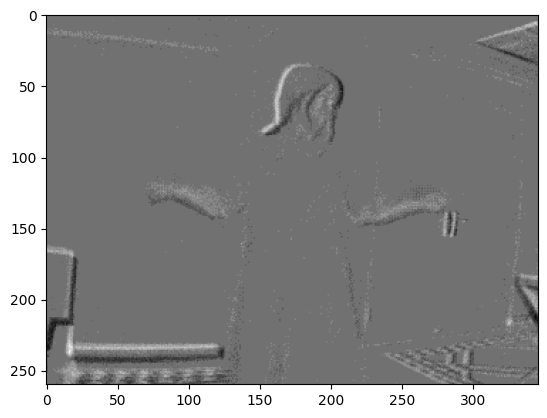

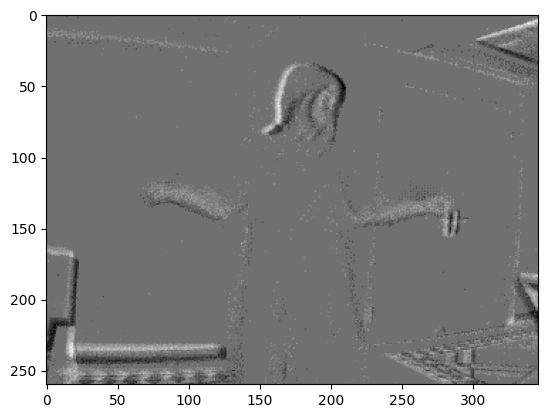

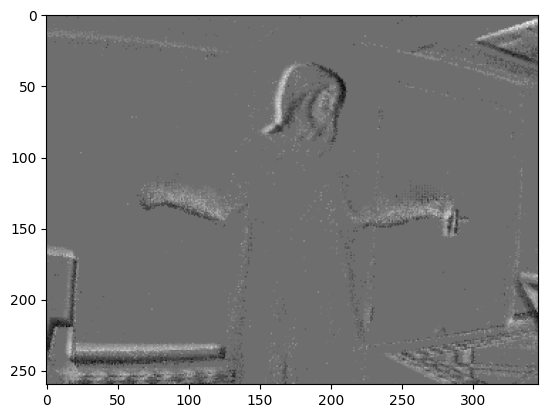

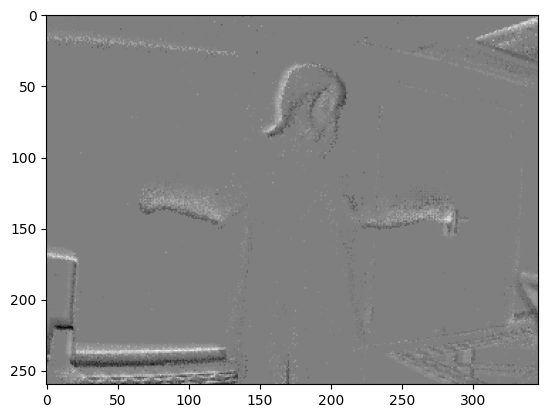

...

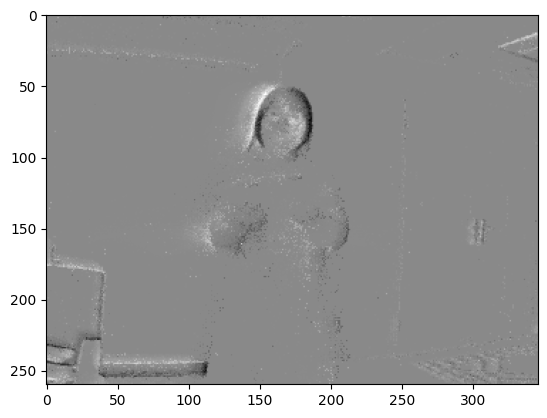

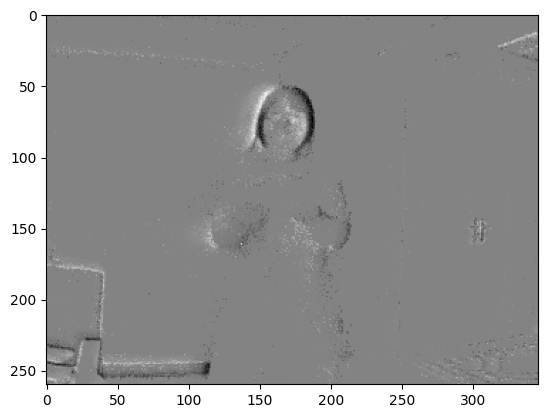

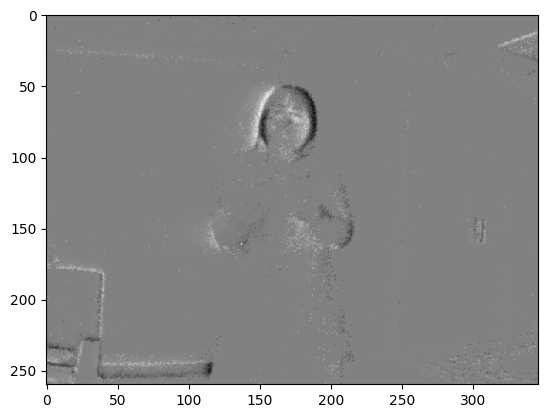

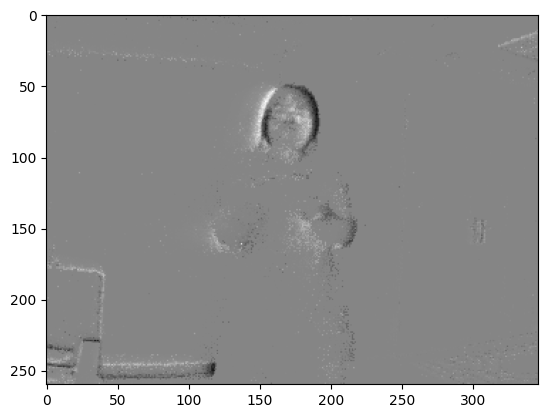

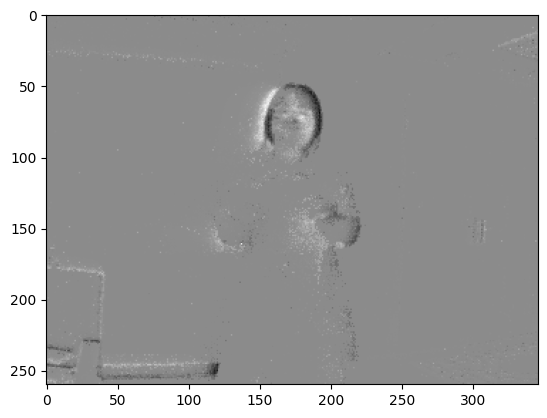

In [84]:
for img in imgs:
    plt.figure()
    plt.imshow(normalize(img).T)

In [85]:
from torchvision.models import efficientnet_b0, EfficientNet
from lava.lib.dl.slayer.image_classification.efficientnet import my_efficientnet_b0, MyEfficientNet
import importlib
import torch
from torch import nn, Tensor
from torch.nn.utils.weight_norm import WeightNorm
from torch.nn import MSELoss, CrossEntropyLoss
from torch.optim import Adam
from lava.lib.dl import slayer
from torchvision.datasets import ImageNet
from sklearn.metrics import accuracy_score
from torchvision import transforms
from PIL import Image
from typing import Iterable, Callable, Dict, List
from lava.lib.dl.slayer.image_classification.piecewise_linear_silu import PiecewiseLinearSiLU
class ReLU1(nn.Module):
    def __init__(self):
        super().__init__()

    def forward(self, x):
        return torch.clamp(x, min=0, max=1)

In [86]:
eff = my_efficientnet_b0(weights='IMAGENET1K_V1',
                             activation=PiecewiseLinearSiLU,
                             scale_act=ReLU1)
checkpoint = torch.load("../image_classification/EffSiLU2.pt")
eff.load_state_dict(checkpoint)
eff.eval();

In [87]:
batch = torch.Tensor([img for img in imgs[:-1][::4]])

/tmp/ipykernel_3267256/3495481857.py:1: UserWarning: Creating a tensor from a list of numpy.ndarrays is extremely slow. Please consider converting the list to a single numpy.ndarray with numpy.array() before converting to a tensor. (Triggered internally at ../torch/csrc/utils/tensor_new.cpp:245.)
  batch = torch.Tensor([img for img in imgs[:-1][::4]])


In [88]:
batch.shape

torch.Size([30, 3, 346, 260])

In [89]:
resolution = 224
preprocess = transforms.Compose([
    transforms.Resize(224 + 2, antialias=None),  # image batch, resize smaller edge to 256
    transforms.CenterCrop(resolution),  # image batch, center crop to square 224x224
    # transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225]),
])

batch = preprocess(batch)

In [90]:
utils = torch.hub.load('NVIDIA/DeepLearningExamples:torchhub', 'nvidia_convnets_processing_utils')

output = torch.nn.functional.softmax(eff(batch.float()), dim=1)
results = utils.pick_n_best(predictions=output.detach(), n=5)
# print(results)

Using cache found in /home/pweidel/.cache/torch/hub/NVIDIA_DeepLearningExamples_torchhub
/home/pweidel/.cache/torch/hub/NVIDIA_DeepLearningExamples_torchhub/PyTorch/Classification/ConvNets/image_classification/models/common.py:13: UserWarning: pytorch_quantization module not found, quantization will not be available
  warnings.warn(
/home/pweidel/.cache/torch/hub/NVIDIA_DeepLearningExamples_torchhub/PyTorch/Classification/ConvNets/image_classification/models/efficientnet.py:17: UserWarning: pytorch_quantization module not found, quantization will not be available
  warnings.warn(


sample 0: [('analog clock', '9.7%'), ("spider web, spider's web", '8.5%'), ('screw', '3.5%'), ('corkscrew, bottle screw', '2.8%'), ('digital clock', '2.5%')]
sample 1: [('oscilloscope, scope, cathode-ray oscilloscope, CRO', '16.2%'), ('digital clock', '10.7%'), ('analog clock', '8.7%'), ("spider web, spider's web", '7.3%'), ('screw', '1.5%')]
sample 2: [('digital clock', '55.3%'), ('oscilloscope, scope, cathode-ray oscilloscope, CRO', '15.8%'), ('analog clock', '1.3%'), ('digital watch', '0.8%'), ('screen, CRT screen', '0.3%')]
sample 3: [('oscilloscope, scope, cathode-ray oscilloscope, CRO', '25.4%'), ('digital clock', '18.6%'), ('analog clock', '3.8%'), ("spider web, spider's web", '2.1%'), ('screen, CRT screen', '1.8%')]
sample 4: [('oscilloscope, scope, cathode-ray oscilloscope, CRO', '54.9%'), ('digital clock', '13.9%'), ('screen, CRT screen', '1.0%'), ('analog clock', '0.8%'), ('digital watch', '0.7%')]
sample 5: [('oscilloscope, scope, cathode-ray oscilloscope, CRO', '63.5%'), (

In [109]:
from model import model_registry, PlSiLUEfficientNetS4D
import os
from torchvision import transforms
import torch
from torch import nn
from torch import optim
import time
import numpy as np
from dataloaders import init_dataloader
from sklearn.metrics import ConfusionMatrixDisplay, accuracy_score

In [110]:
num_classes = 10
model_params = {"lstm_num_hidden": 1280,
                "num_readout_hidden": 128,
                "readout_bias": False,
                "s4d_num_hidden": 1280,
                "s4d_states": 64,
                "s4d_is_real": True,
                "s4d_lr": 0.0,
                "yolo_model_path": "",
                "yolo_args_path": "",
                }
model = PlSiLUEfficientNetS4D(num_classes=num_classes, **model_params)

In [111]:
checkpoint = torch.load("efficientnet-b0-pl-silu-S4D.pth")
model.load_state_dict(checkpoint);
model.eval();

In [112]:
out = model(batch.unsqueeze(0))

In [113]:
torch.argmax(out)

tensor(0)

# USE DATASET

In [1]:
from hardvs_dataset import HARDVSDataset
import os
from torchvision import transforms
import torch
import matplotlib.pyplot as plt

In [2]:
data_root = "/ssd2/users/pweidel/datasets/HARDVS"
partition = "test"
num_frames_per_sample = 30
resolution=224

In [11]:
annotation_file = os.path.join(data_root, partition + '.txt')

preprocess = transforms.Compose([
    transforms.ToTensor(),
    transforms.Resize(resolution + 2, antialias=None),  # image batch, resize smaller edge
    transforms.CenterCrop(resolution),  # image batch, center crop to square 224x224
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225]),
])

dataset = HARDVSDataset(
    annotationfile_path=annotation_file,
    num_segments=num_frames_per_sample,
    frames_per_segment=1,
    transform=preprocess,
    test_mode=False if partition == "train" else True,
    classify_labels=list(range(1, 300)),
)

In [12]:
d = dataset[10]

247


In [13]:
d[0][2].shape

torch.Size([3, 224, 224])

In [14]:
len(dataset.label_map)

299

/tmp/ipykernel_3286479/3446981520.py:1: UserWarning: The use of `x.T` on tensors of dimension other than 2 to reverse their shape is deprecated and it will throw an error in a future release. Consider `x.mT` to transpose batches of matrices or `x.permute(*torch.arange(x.ndim - 1, -1, -1))` to reverse the dimensions of a tensor. (Triggered internally at ../aten/src/ATen/native/TensorShape.cpp:3571.)
  plt.imshow(d[0][29].T.sum(-1).numpy())


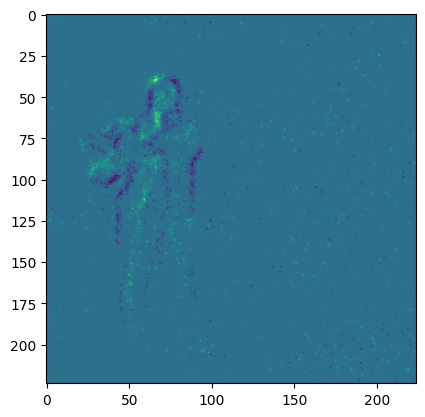

In [6]:
plt.imshow(d[0][29].T.sum(-1).numpy())

# User Dataloaders

In [7]:
from dataloaders import init_HARDVS_dataloader
import numpy as np

In [8]:
data = init_HARDVS_dataloader(partition=partition,
                              batch_size=8,
                              num_frames_per_sample=30,
                              resolution=224,
                              data_root=data_root)

300


In [9]:
for inp, tgt in data:
    print(inp.shape, tgt)
    

263
285
254
282
255
265
253
259
285
250
322
267
300
266
260
236
247
244
307
263
256
306
266
288
283
249
311
258
262
269
285
378
294
257
361
251
262
320
297
263
307
446
293
297
264
278
346
263
257
281
282
250
271
321
270
355
323
306
255
294
257
267
262
264
260
263
249
253
278
274
278
311
340
365
258
314
273
288
299
258
308
25395290


300
324
281
245
299
243
293
255
431
295
272
261
257
253
278
314
261
281
287
252
262
280
245
309
240
261
272
249
396
249
248
283
251
277
390
332
302
257
252
395
267
271
253
290
273
299
260
251
300
250
319
252
252
263
310
250
torch.Size([8, 30, 3, 224, 224]) tensor([278, 195,  38,  42, 150,  27, 281, 170])
torch.Size([8, 30, 3, 224, 224]) tensor([ 67,  26, 136,  62, 110,  49, 135, 244])
torch.Size([8, 30, 3, 224, 224]) tensor([215, 121,  31,  76, 137,  31, 135,  41])
torch.Size([8, 30, 3, 224, 224]) tensor([ 87, 280,  57,  68, 138, 280, 197,  80])
torch.Size([8, 30, 3, 224, 224]) tensor([146, 115,  82, 137, 251,   2, 159, 154])
torch.Size([8, 30, 3, 224, 224]

KeyboardInterrupt: 

In [ ]:
tgt